# Adversarial Attacks on Deep Learning Models
# Deep Learning Project 3 - Spring 2025

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import os
import json
import torch
import numpy as np
import matplotlib.pyplot as plt
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from tqdm import tqdm
import random
import torch.nn.functional as F
import zipfile

In [3]:
# Set random seeds for reproducibility
random.seed(42)
np.random.seed(42)
torch.manual_seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(42)

# Set device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda:0


In [4]:
import urllib.request

# official ImageNet “class_index” maps strings "0"→["n01440764","tench"], …
url = "https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json"
with urllib.request.urlopen(url) as resp:
    imagenet_idx = json.load(resp)

# build WNID→int index
wnid_to_idx = {v[0]: int(k) for k, v in imagenet_idx.items()}

label_map = wnid_to_idx


# # Map int index to readable label
# label_map = {int(k): v[1] for k, v in class_idx.items()}

# # Load the ImageNet class labels
# with open("label_map.json", "r") as f:
#     label_map = json.load(f)

# # Convert string keys to integers for easier lookup
# label_map = {int(k): v for k, v in label_map.items()}

In [5]:
# Constants
EPSILON_SMALL = 0.02  # For whole-image attacks
EPSILON_LARGE = 0.5   # For patch attacks
PATCH_SIZE = 64       # Size of patch for task 4; sk changed from 32 to 64
STEP_SIZE = 0.005  # for task-3

In [6]:
# Preprocessing for ImageNet
mean_norms = np.array([0.485, 0.456, 0.406])
std_norms = np.array([0.229, 0.224, 0.225])

plain_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=mean_norms, std=std_norms)
])

In [7]:
# Path to the dataset
dataset_path = "/content/drive/MyDrive/TestDataSet"

# with zipfile.ZipFile("TestDataSet.zip", "r") as z:
#     z.extractall(dataset_path)

# with open(os.path.join(dataset_path, "labels_list.json"), "r") as f:
#     folder_to_idx = json.load(f)

with open("/content/drive/MyDrive/TestDataSet/labels_list.json","r") as f:
    folder_to_idx = json.load(f)


In [8]:
# Function to compute accuracy metrics
def compute_accuracy(model, dataloader, top_k=(1, 5)):
    model.eval()
    top_k_correct = {k: 0 for k in top_k}
    total = 0

    with torch.no_grad():
        for images, labels in tqdm(dataloader):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)

            # Get the top k predictions
            _, pred = outputs.topk(max(top_k), 1, True, True)
            pred = pred.t()
            correct = pred.eq(labels.view(1, -1).expand_as(pred))

            # Count correct predictions for each k
            for k in top_k:
                top_k_correct[k] += correct[:k].reshape(-1).float().sum(0).item()

            total += labels.size(0)

    # Calculate accuracy for each k
    accuracy = {k: top_k_correct[k] / total * 100 for k in top_k}
    return accuracy


In [43]:
def visualize_examples(original_images, adversarial_images, original_preds, adversarial_preds, true_labels, n_examples=5, patch_locations=None, patch_size=None):
    """
    Visualize original and adversarial images with top-5 prediction vertical bar charts.
    Highlights true label in green if present in top-5.

    Parameters:
    - original_images: List of original images
    - adversarial_images: List of adversarial images
    - original_preds: List of model predictions on original images
    - adversarial_preds: List of model predictions on adversarial images
    - true_labels: List of true labels
    - n_examples: Number of examples to visualize
    - patch_locations: Optional list of (x, y) patch locations for patch attacks
    - patch_size: Optional patch size for patch attacks
    """
    model.eval()
    plt.figure(figsize=(20, 6 * min(n_examples, len(original_images))))

    # Consistent denormalize function
    def denormalize(tensor):
        mean = torch.tensor(mean_norms, device=tensor.device).view(1, 3, 1, 1)
        std = torch.tensor(std_norms, device=tensor.device).view(1, 3, 1, 1)
        return tensor * std + mean

    for i in range(min(n_examples, len(original_images))):
        orig_img = original_images[i].to(device)
        adv_img = adversarial_images[i].to(device)
        true_label = true_labels[i].item()

        with torch.no_grad():
            # Get model predictions
            orig_output = model(orig_img.unsqueeze(0))
            adv_output = model(adv_img.unsqueeze(0))

            # Convert to probabilities
            orig_probs = F.softmax(orig_output, dim=1)
            adv_probs = F.softmax(adv_output, dim=1)

            # Get top-5 predictions
            orig_top5_prob, orig_top5_idx = orig_probs.topk(5, dim=1)
            adv_top5_prob, adv_top5_idx = adv_probs.topk(5, dim=1)

            # Convert to numpy for plotting
            orig_top5_prob = orig_top5_prob.squeeze().cpu().numpy()
            orig_top5_idx = orig_top5_idx.squeeze().cpu().numpy()
            adv_top5_prob = adv_top5_prob.squeeze().cpu().numpy()
            adv_top5_idx = adv_top5_idx.squeeze().cpu().numpy()

            # Get class names
            orig_top5_classes = [label_map[idx] for idx in orig_top5_idx]
            adv_top5_classes = [label_map[idx] for idx in adv_top5_idx]

            # Denormalize images for display
            orig_denorm = denormalize(orig_img.unsqueeze(0)).squeeze(0)
            adv_denorm = denormalize(adv_img.unsqueeze(0)).squeeze(0)

            # Calculate L∞ distance
            l_inf_dist = (adv_denorm - orig_denorm).abs().max().item()

            # Convert to numpy for plotting
            orig_img_np = orig_denorm.detach().cpu().numpy().transpose(1, 2, 0)
            adv_img_np = adv_denorm.detach().cpu().numpy().transpose(1, 2, 0)

            # Create difference map
            diff_img = (adv_denorm - orig_denorm).abs().mean(dim=0).detach().cpu().numpy()
            diff_img = diff_img / diff_img.max() if diff_img.max() > 0 else diff_img

        # Plot original image
        plt.subplot(n_examples, 5, 5*i + 1)
        plt.imshow(np.clip(orig_img_np, 0, 1))
        plt.title(f"Original\nTrue: {label_map[true_label]}")
        plt.axis('off')

        # Plot adversarial image
        plt.subplot(n_examples, 5, 5*i + 2)
        plt.imshow(np.clip(adv_img_np, 0, 1))

        # Add patch visualization if provided
        if patch_locations and patch_size and i < len(patch_locations):
            x, y = patch_locations[i]
            rect = plt.Rectangle((x, y), patch_size, patch_size,
                                 linewidth=2, edgecolor='r', facecolor='none')
            plt.gca().add_patch(rect)
            plt.title(f"Adversarial (Patch)\nPredicted: {label_map[adversarial_preds[i].item()]}")
        else:
            plt.title(f"Adversarial\nPredicted: {label_map[adversarial_preds[i].item()]}")

        plt.axis('off')

        # Plot difference
        plt.subplot(n_examples, 5, 5*i + 3)
        plt.imshow(diff_img, cmap='viridis')
        plt.title(f"Difference Map\nL∞ dist: {l_inf_dist:.4f}")
        plt.axis('off')

        # Original top-5 predictions bar chart
        ax1 = plt.subplot(n_examples, 5, 5*i + 4)
        orig_colors = ['green' if idx == true_label else 'blue' for idx in orig_top5_idx]
        x_pos = np.arange(len(orig_top5_classes))
        ax1.bar(x_pos, orig_top5_prob, color=orig_colors)
        ax1.set_xticks(x_pos)
        ax1.set_xticklabels(orig_top5_classes, rotation=45, ha='right')
        ax1.set_ylabel("Probability")
        ax1.set_title("Original Top-5 Predictions")

        # Adversarial top-5 predictions bar chart
        ax2 = plt.subplot(n_examples, 5, 5*i + 5)
        adv_colors = ['green' if idx == true_label else 'red' for idx in adv_top5_idx]
        x_pos = np.arange(len(adv_top5_classes))
        ax2.bar(x_pos, adv_top5_prob, color=adv_colors)
        ax2.set_xticks(x_pos)
        ax2.set_xticklabels(adv_top5_classes, rotation=45, ha='right')
        ax2.set_ylabel("Probability")
        ax2.set_title("Adversarial Top-5 Predictions")

    plt.tight_layout()
    plt.savefig('adversarial_examples.png', dpi=300, bbox_inches='tight')
    plt.show()

In [23]:
# Function to save adversarial examples to disk
def save_adversarial_dataset(original_dataset, adversarial_images, output_dir):
    import os
    os.makedirs(output_dir, exist_ok=True)

    # label → WNID map
    idx_to_class = getattr(original_dataset, "idx_to_class",
                           {v:k for k,v in original_dataset.class_to_idx.items()})

    # create one subfolder per WNID under output_dir
    for wnid in original_dataset.classes:
        os.makedirs(os.path.join(output_dir, wnid), exist_ok=True)

    # save each image into its wnid folder
    for idx, (_, label) in enumerate(original_dataset):
        wnid = idx_to_class[label]
        adv_img = adversarial_images[idx]

        # de-normalize
        img_denorm = (adv_img * torch.tensor(std_norms, device=adv_img.device).view(3,1,1)
                      + torch.tensor(mean_norms, device=adv_img.device).view(3,1,1))
        img_denorm = torch.clamp(img_denorm, 0, 1)

        # to PIL and save
        img_pil = transforms.ToPILImage()(img_denorm.cpu())
        img_pil.save(os.path.join(output_dir, wnid, f"{idx}.png"))

    print(f"Saved adversarial dataset to {output_dir}")


In [11]:
# Custom dataset class for holding adversarial examples
class AdversarialDataset(torch.utils.data.Dataset):
    def __init__(self, original_dataset, adversarial_images):
        self.original_dataset = original_dataset
        self.adversarial_images = adversarial_images

    def __len__(self):
        return len(self.original_dataset)

    def __getitem__(self, idx):
        _, label = self.original_dataset[idx]
        return self.adversarial_images[idx], label

# Function to create a dataloader for the adversarial dataset
def create_adversarial_dataloader(original_dataset, adversarial_images, batch_size=64):
    adversarial_dataset = AdversarialDataset(original_dataset, adversarial_images)
    return DataLoader(adversarial_dataset, batch_size=batch_size, shuffle=False)


In [12]:
#########################################
# Task 1: Evaluate the baseline model
#########################################
print("\n============ Task 1: Baseline Evaluation ============")

# Load the dataset
dataset = torchvision.datasets.ImageFolder(root=dataset_path, transform=plain_transforms)
dataset.class_to_idx = {wnid: wnid_to_idx[wnid] for wnid in dataset.classes}

new_samples = []
for file_path, _ in dataset.samples:
    wnid = os.path.basename(os.path.dirname(file_path))
    true_idx = dataset.class_to_idx[wnid]
    new_samples.append((file_path, true_idx))

dataset.samples = new_samples
dataset.targets = [label for _, label in new_samples]


print("New targets sample:", dataset.targets[:10])

# # Load the dataset
# dataset = torchvision.datasets.ImageFolder(root=dataset_path, transform=plain_transforms)
# Load the dataset—and then override its internal mapping to match your JSON
# dataset = torchvision.datasets.ImageFolder(root=dataset_path, transform=plain_transforms)
# dataset.class_to_idx = folder_to_idx
dataset.idx_to_class = {v: k for k, v in dataset.class_to_idx.items()}

dataloader = DataLoader(dataset, batch_size=64, shuffle=False)
print(f"Classes on disk:   {dataset.classes[:5]} …")
print(f"class_to_idx sample: {list(dataset.class_to_idx.items())[:5]}")
print(f"Dataset.targets sample: {dataset.targets[:10]}")

print(f"Loaded dataset with {len(dataset)} images from {len(dataset.classes)} classes")

# Load the pre-trained ResNet-34 model
model = torchvision.models.resnet34(weights='IMAGENET1K_V1')
model = model.to(device)
model.eval()
print("Loaded pre-trained ResNet-34 model")

# Evaluate the model on the test dataset
baseline_accuracy = compute_accuracy(model, dataloader)
print(f"Baseline Top-1 Accuracy: {baseline_accuracy[1]:.2f}%")
print(f"Baseline Top-5 Accuracy: {baseline_accuracy[5]:.2f}%")



============ Task 1: Baseline Evaluation ============
New targets sample: [401, 401, 401, 401, 401, 402, 402, 402, 402, 402]
Classes on disk:   ['n02672831', 'n02676566', 'n02687172', 'n02690373', 'n02692877'] …
class_to_idx sample: [('n02672831', 401), ('n02676566', 402), ('n02687172', 403), ('n02690373', 404), ('n02692877', 405)]
Dataset.targets sample: [401, 401, 401, 401, 401, 402, 402, 402, 402, 402]
Loaded dataset with 500 images from 100 classes
Loaded pre-trained ResNet-34 model


100%|██████████| 8/8 [02:48<00:00, 21.10s/it]

Baseline Top-1 Accuracy: 76.00%
Baseline Top-5 Accuracy: 94.20%


In [13]:
# # near the top of the notebook, right after imports
# with open("/kaggle/input/input-dataset/TestDataSet/labels_list.json", "r") as f:
#     label_map = json.load(f)
# label_map = {int(k): v for k, v in label_map.items()}

# official ImageNet “class_index” maps strings "0"→["n01440764","tench"], …
url = "https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json"
with urllib.request.urlopen(url) as resp:
    label_map = json.load(resp)
label_map = {int(k): v for k, v in label_map.items()}


# label_map = {int(k): v[1] for k, v in label_list.items()}

# Convert list of strings into a dictionary
# label_map = {}
# for entry in label_list:
#     idx_str, label = entry.split(": ", 1)
#     label_map[int(idx_str)] = label

# # Now label_map[401] will return 'accordion'
# print(label_map[401])

# wnid_to_idx = {int(k): v[1] for k, v in imagenet_idx.items()}



============ Task 2: FGSM Attacks ============


100%|██████████| 8/8 [00:04<00:00,  1.65it/s]


Maximum perturbation (L∞) in pixel space: 0.020000 (Target: 0.02)
Found 413 successful attacks out of 500 images


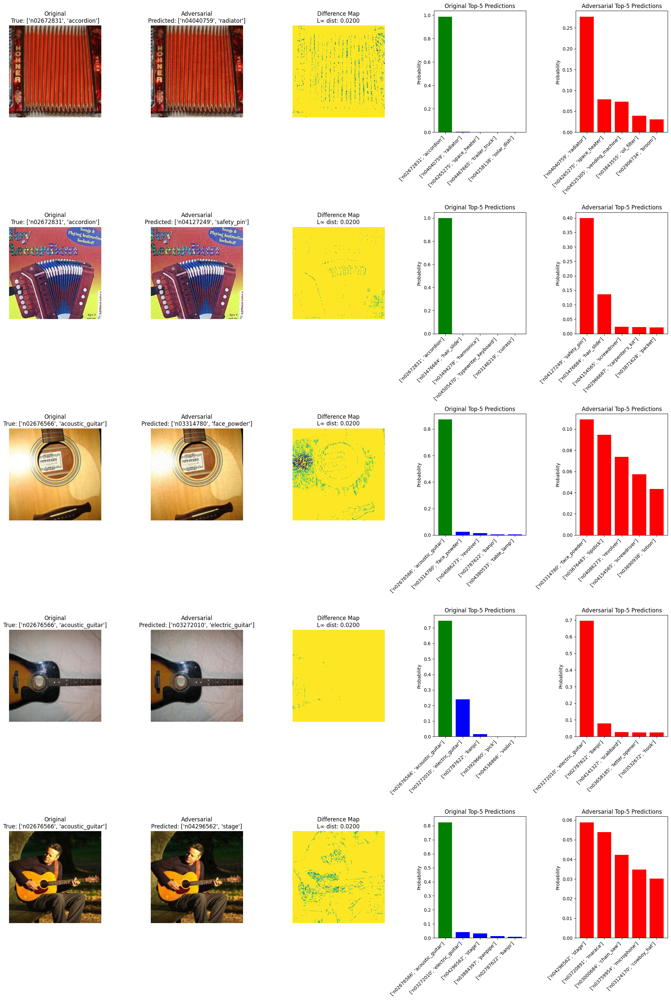

100%|██████████| 8/8 [00:02<00:00,  3.37it/s]


FGSM Attack Top-1 Accuracy: 3.40%
FGSM Attack Top-5 Accuracy: 21.20%
Top-1 Accuracy Drop: 72.60%
Saved adversarial dataset to Adversarial_Test_Set_1


In [44]:
#########################################
# Task 2: Implement FGSM attacks
#########################################
print("\n============ Task 2: FGSM Attacks ============")

def denormalize(tensor, mean, std):
    mean = torch.tensor(mean, device=tensor.device).view(1, 3, 1, 1)
    std = torch.tensor(std, device=tensor.device).view(1, 3, 1, 1)
    return tensor * std + mean

def fgsm_attack(model, orig, labels, epsilon):
    model.eval()
    orig = orig.clone().detach().to(device)
    orig.requires_grad = True

    outputs = model(orig)
    loss = F.cross_entropy(outputs, labels)
    model.zero_grad()
    loss.backward()

    # 1) per-channel epsilon in normalized space
    # eps = torch.tensor(epsilon , device=device, dtype=torch.float).view(1,3,1,1)
    # eps = torch.tensor([epsilon / s for s in std_norms], device=device).view(1, 3, 1, 1)
    eps = epsilon

    # 2) take sign step
    grad_sign = orig.grad.sign()
    perturbed = orig + eps * grad_sign

    # 3) project into epsilon-ball around orig
    delta = torch.clamp(perturbed - orig, -eps, eps)
    perturbed = orig + delta

    # 4) clamp to valid normalized range
    min_val = torch.tensor((0-mean_norms)/std_norms, device=device, dtype=torch.float).view(1,3,1,1)
    max_val = torch.tensor((1-mean_norms)/std_norms, device=device, dtype=torch.float).view(1,3,1,1)

    perturbed = torch.max(torch.min(perturbed, max_val), min_val)

    return perturbed.type_as(orig)

# Generate FGSM adversarial examples for the entire dataset
all_adversarial_images_fgsm = []
all_original_images = []
all_original_preds = []
all_adversarial_preds = []
all_true_labels = []

model.eval()

# Convert to normalized epsilon
normalized_eps = torch.tensor(
    [EPSILON_SMALL / s for s in std_norms],
    device=device
).view(1, 3, 1, 1)


for images, labels in tqdm(dataloader):
    images, labels = images.to(device), labels.to(device)

    # Get predictions on original images
    with torch.no_grad():
        outputs = model(images)
        _, original_preds = outputs.max(1)

    # Generate adversarial examples
    # print("Input stats:", images.min().item(), images.max().item())
    adversarial_images = fgsm_attack(model, images, labels, normalized_eps)

    # Get predictions on adversarial images
    with torch.no_grad():
        adv_outputs = model(adversarial_images)
        _, adversarial_preds = adv_outputs.max(1)

    # Store successful attacks for visualization
    for i in range(len(images)):
        all_original_images.append(images[i])
        all_adversarial_images_fgsm.append(adversarial_images[i])
        all_original_preds.append(original_preds[i])
        all_adversarial_preds.append(adversarial_preds[i])
        all_true_labels.append(labels[i])

# Verify L∞ distance constraint
# max_perturbation = 0
# for orig, adv in zip(all_original_images, all_adversarial_images_fgsm):
#     # max_perturbation = max(max_perturbation, (adv - orig).abs().max().item())
#     max_perturbation = max((adv - orig).abs().max().item() for orig, adv in zip(all_original_images, all_adversarial_images_fgsm))


# print(f"Maximum perturbation (L∞): {max_perturbation:.6f} (Target: {EPSILON_SMALL})")

max_pixel_perturbation = 0
for orig, adv in zip(all_original_images, all_adversarial_images_fgsm):
    orig_px = denormalize(orig.unsqueeze(0), mean_norms, std_norms)
    adv_px = denormalize(adv.unsqueeze(0), mean_norms, std_norms)
    delta = (adv_px - orig_px).abs().max().item()
    max_pixel_perturbation = max(max_pixel_perturbation, delta)

print(f"Maximum perturbation (L∞) in pixel space: {max_pixel_perturbation:.6f} (Target: {EPSILON_SMALL})")

# Find successful attack examples (where predictions changed)
successful_indices = [i for i in range(len(all_original_preds))
                      if all_original_preds[i] != all_adversarial_preds[i]]
print(f"Found {len(successful_indices)} successful attacks out of {len(all_original_preds)} images")

# Visualize some successful attacks
if successful_indices:
    selected_indices = successful_indices[:5]  # Select up to 5 successful attacks
    visualize_examples(
        [all_original_images[i] for i in selected_indices],
        [all_adversarial_images_fgsm[i] for i in selected_indices],
        [all_original_preds[i] for i in selected_indices],
        [all_adversarial_preds[i] for i in selected_indices],
        [all_true_labels[i] for i in selected_indices]
    )

# Create and evaluate the FGSM adversarial dataset
fgsm_dataloader = create_adversarial_dataloader(dataset, all_adversarial_images_fgsm)
fgsm_accuracy = compute_accuracy(model, fgsm_dataloader)
print(f"FGSM Attack Top-1 Accuracy: {fgsm_accuracy[1]:.2f}%")
print(f"FGSM Attack Top-5 Accuracy: {fgsm_accuracy[5]:.2f}%")
print(f"Top-1 Accuracy Drop: {baseline_accuracy[1] - fgsm_accuracy[1]:.2f}%")

# Save the FGSM adversarial dataset
save_adversarial_dataset(dataset, all_adversarial_images_fgsm, "Adversarial_Test_Set_1")



============ Task 3: Improved Attacks (PGD) ============


100%|██████████| 8/8 [00:46<00:00,  5.79s/it]


Max L∞ in pixel space: 0.020000
Found 437 successful attacks out of 500 images


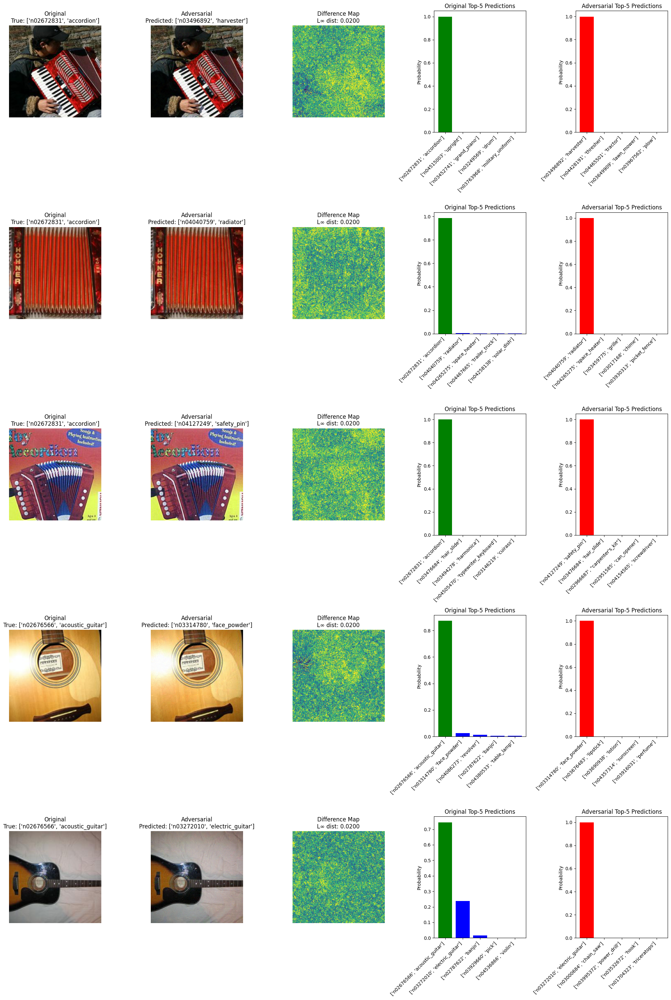

100%|██████████| 8/8 [00:02<00:00,  3.31it/s]


PGD Attack Top-1 Accuracy: 0.00%
PGD Attack Top-5 Accuracy: 0.60%
Top-1 Accuracy Drop: 76.00%
Saved adversarial dataset to Adversarial_Test_Set_2


In [45]:
#########################################
# Task 3: Improved Attacks (Projected Gradient Descent)
#########################################
print("\n============ Task 3: Improved Attacks (PGD) ============")

def denormalize(img):
    mean = torch.tensor(mean_norms).view(1, 3, 1, 1).to(img.device)
    std = torch.tensor(std_norms).view(1, 3, 1, 1).to(img.device)
    return img * std + mean

def pgd_attack(model, images, labels, epsilon, alpha, iterations=10, targeted=False, target_class=None):
    """
    Projected Gradient Descent (PGD) attack in normalized space, with L∞ constraint.
    Inputs must be float32.
    """
    model.eval()

    # Pick random target classes if targeted attack
    if targeted and target_class is None:
        target_class = torch.randint(0, 1000, (labels.shape[0],), device=images.device)
        for i in range(len(target_class)):
            while target_class[i] == labels[i]:
                target_class[i] = torch.randint(0, 1000, (1,), device=images.device)

    # Clone and convert to float32
    perturbed_images = images.clone().detach().float()

    # Valid range in normalized space
    min_val = torch.tensor((0 - mean_norms) / std_norms, device=images.device, dtype=torch.float32).view(1, 3, 1, 1)
    max_val = torch.tensor((1 - mean_norms) / std_norms, device=images.device, dtype=torch.float32).view(1, 3, 1, 1)

    # Add small noise in [-ε, ε]
    noise = (torch.rand_like(perturbed_images) - 0.5) * 2 * epsilon
    perturbed_images = torch.clamp(perturbed_images + noise, min_val, max_val)

    for _ in range(iterations):
        perturbed_images.requires_grad = True
        outputs = model(perturbed_images)

        loss = -F.cross_entropy(outputs, target_class) if targeted else F.cross_entropy(outputs, labels)

        model.zero_grad()
        loss.backward()

        with torch.no_grad():
            grad_sign = perturbed_images.grad.sign()
            perturbed_images = perturbed_images + alpha * grad_sign

            delta = torch.clamp(perturbed_images - images, -epsilon, epsilon)
            perturbed_images = torch.clamp(images + delta, min_val, max_val)

    return perturbed_images.detach()



# Generate PGD adversarial examples for the entire dataset
all_adversarial_images_pgd = []
all_pgd_preds = []

model.eval()
for images, labels in tqdm(dataloader):
    images, labels = images.to(device), labels.to(device)

    # Generate adversarial examples with PGD
    # Using targeted attack with higher iterations for better results
    # adversarial_images = pgd_attack(
    #     model, images, labels,
    #     epsilon=EPSILON_SMALL,
    #     alpha=0.005,  # Smaller step size
    #     iterations=20,  # More iterations
    #     targeted=False  # Targeted attack #sk changed this
    # )
    # Convert pixel-space ε to normalized-space ε (per channel)
    # Convert to normalized per-channel values with float32 dtype
    normalized_eps = torch.tensor(
        [EPSILON_SMALL / s for s in std_norms],
        device=device,
        dtype=torch.float32
    ).view(1, 3, 1, 1)

    normalized_alpha = torch.tensor(
        [STEP_SIZE / s for s in std_norms],
        device=device,
        dtype=torch.float32
    ).view(1, 3, 1, 1)

    # Call PGD
    adversarial_images = pgd_attack(
        model, images, labels,
        epsilon=normalized_eps,
        alpha=normalized_alpha,
        iterations=20,
        targeted=False
    )

    # Get predictions on adversarial images
    with torch.no_grad():
        adv_outputs = model(adversarial_images)
        _, adversarial_preds = adv_outputs.max(1)

    # Store generated images and predictions
    for i in range(len(images)):
        all_adversarial_images_pgd.append(adversarial_images[i])
        all_pgd_preds.append(adversarial_preds[i])

# # Verify L∞ distance constraint
# max_perturbation = 0
# for orig, adv in zip(all_original_images, all_adversarial_images_pgd):
#     max_perturbation = max(max_perturbation, (adv - orig).abs().max().item())

# print(f"Maximum perturbation (L∞): {max_perturbation:.6f} (Target: {EPSILON_SMALL})")

max_pixel_perturbation = 0
for orig, adv in zip(all_original_images, all_adversarial_images_pgd):
    orig_px = denormalize(orig.unsqueeze(0))
    adv_px = denormalize(adv.unsqueeze(0))
    delta = (adv_px - orig_px).abs().max().item()
    max_pixel_perturbation = max(max_pixel_perturbation, delta)

print(f"Max L∞ in pixel space: {max_pixel_perturbation:.6f}")

# Find successful attack examples (where predictions changed)
successful_indices = [i for i in range(len(all_original_preds))
                      if all_original_preds[i] != all_pgd_preds[i]]
print(f"Found {len(successful_indices)} successful attacks out of {len(all_original_preds)} images")

# Visualize some successful attacks
if successful_indices:
    selected_indices = successful_indices[:5]  # Select up to 5 successful attacks
    visualize_examples(
        [all_original_images[i] for i in selected_indices],
        [all_adversarial_images_pgd[i] for i in selected_indices],
        [all_original_preds[i] for i in selected_indices],
        [all_pgd_preds[i] for i in selected_indices],
        [all_true_labels[i] for i in selected_indices]
    )

# Create and evaluate the PGD adversarial dataset
pgd_dataloader = create_adversarial_dataloader(dataset, all_adversarial_images_pgd)
pgd_accuracy = compute_accuracy(model, pgd_dataloader)
print(f"PGD Attack Top-1 Accuracy: {pgd_accuracy[1]:.2f}%")
print(f"PGD Attack Top-5 Accuracy: {pgd_accuracy[5]:.2f}%")
print(f"Top-1 Accuracy Drop: {baseline_accuracy[1] - pgd_accuracy[1]:.2f}%")

# Save the PGD adversarial dataset
save_adversarial_dataset(dataset, all_adversarial_images_pgd, "Adversarial_Test_Set_2")



============ Task 4: Patch Attacks ============


100%|██████████| 8/8 [01:56<00:00, 14.56s/it]


Found 455 successful patch attacks out of 500 images


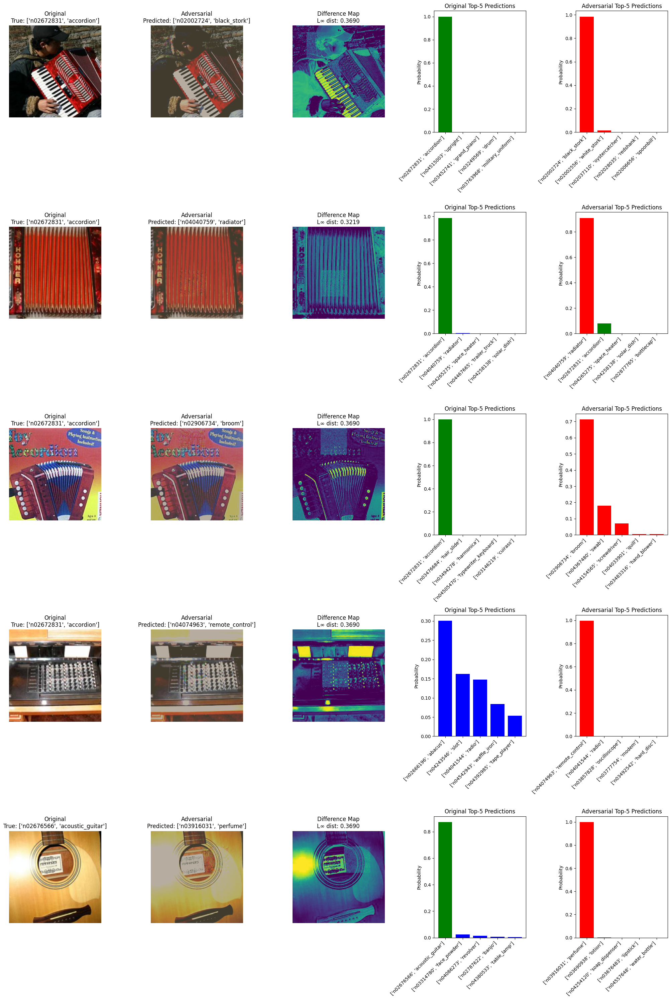

100%|██████████| 8/8 [00:02<00:00,  3.08it/s]


Patch Attack Top-1 Accuracy: 1.60%
Patch Attack Top-5 Accuracy: 22.80%
Top-1 Accuracy Drop: 74.40%
Saved adversarial dataset to Adversarial_Test_Set_3


In [46]:
#########################################
# Task 4: Patch Attacks
#########################################
print("\n============ Task 4: Patch Attacks ============")

def patch_attack(model, images, labels, patch_size=32, epsilon=0.5, alpha=0.1, iterations=50, targeted=True):
    """
    Patch attack that modifies only a small square patch of the image
    """
    model.eval()
    batch_size, c, h, w = images.shape

    # Initialize perturbed images as copies of the original
    perturbed_images = images.clone().detach()

    # Create a random target class for each image (different from the true class)
    target_classes = torch.randint(0, 1000, (batch_size,)).to(device)
    for i in range(batch_size):
        while target_classes[i] == labels[i]:
            target_classes[i] = torch.randint(0, 1000, (1,)).to(device)

    # For each image, select a random patch location
    patch_locations = []
    patch_masks = []

    for _ in range(batch_size):
        # Random top-left corner of the patch
        x_loc = random.randint(0, w - patch_size)
        y_loc = random.randint(0, h - patch_size)
        patch_locations.append((x_loc, y_loc))

        # Create a mask for this patch location
        mask = torch.zeros((c, h, w), device=device)
        mask[:, y_loc:y_loc+patch_size, x_loc:x_loc+patch_size] = 1.0
        patch_masks.append(mask)

    patch_masks = torch.stack(patch_masks)

    # PGD optimization for the patches
    for _ in range(iterations):
        perturbed_images.requires_grad = True

        # Forward pass
        outputs = model(perturbed_images)

        # Calculate loss (target class for targeted attack)
        if targeted:
            loss = -F.cross_entropy(outputs, target_classes)
        else:
            loss = F.cross_entropy(outputs, labels)

        # Zero gradients
        model.zero_grad()

        # Calculate gradients
        loss.backward()

        # Update only the patch area
        with torch.no_grad():
            grad = perturbed_images.grad.detach()

            # Apply gradient step only to the patch area
            update = alpha * grad.sign() * patch_masks
            perturbed_images = perturbed_images.detach() + update

            # Project perturbation to epsilon ball (only for the patch)
            delta = (perturbed_images - images) * patch_masks
            delta = torch.clamp(delta, -epsilon, epsilon)
            perturbed_images = torch.clamp(images + delta, -1, 1)

    return perturbed_images, patch_locations, patch_size

# Generate patch adversarial examples for the entire dataset
all_adversarial_images_patch = []
all_patch_preds = []
all_patch_locations = []

model.eval()
for images, labels in tqdm(dataloader):
    images, labels = images.to(device), labels.to(device)

    # Generate adversarial examples with patch attack
    adversarial_images, patch_locs, _ = patch_attack(
        model, images, labels,
        patch_size=PATCH_SIZE,
        epsilon=EPSILON_LARGE,
        alpha=0.1,
        iterations=50,
        targeted=False
    )

    # Get predictions on adversarial images
    with torch.no_grad():
        adv_outputs = model(adversarial_images)
        _, adversarial_preds = adv_outputs.max(1)

    # Store generated images and predictions
    for i in range(len(images)):
        all_adversarial_images_patch.append(adversarial_images[i])
        all_patch_preds.append(adversarial_preds[i])
        all_patch_locations.append(patch_locs[i])

# Find successful attack examples (where predictions changed)
successful_indices = [i for i in range(len(all_original_preds))
                      if all_original_preds[i] != all_patch_preds[i]]
print(f"Found {len(successful_indices)} successful patch attacks out of {len(all_original_preds)} images")

# Visualize some successful attacks
if successful_indices:
    selected_indices = successful_indices[:5]  # Select up to 5 successful attacks
    visualize_examples(
        [all_original_images[i] for i in selected_indices],
        [all_adversarial_images_patch[i] for i in selected_indices],
        [all_original_preds[i] for i in selected_indices],
        [all_patch_preds[i] for i in selected_indices],
        [all_true_labels[i] for i in selected_indices]
    )

# Create and evaluate the patch adversarial dataset
patch_dataloader = create_adversarial_dataloader(dataset, all_adversarial_images_patch)
patch_accuracy = compute_accuracy(model, patch_dataloader)
print(f"Patch Attack Top-1 Accuracy: {patch_accuracy[1]:.2f}%")
print(f"Patch Attack Top-5 Accuracy: {patch_accuracy[5]:.2f}%")
print(f"Top-1 Accuracy Drop: {baseline_accuracy[1] - patch_accuracy[1]:.2f}%")

# Save the patch adversarial dataset
save_adversarial_dataset(dataset, all_adversarial_images_patch, "Adversarial_Test_Set_3")


In [47]:
#########################################
# Task 5: Transferability to Other Models
#########################################
print("\n============ Task 5: Attack Transferability ============")

# Load DenseNet-121 as a different model architecture
transfer_model = torchvision.models.densenet121(weights='IMAGENET1K_V1')
transfer_model = transfer_model.to(device)
transfer_model.eval()
print("Loaded pre-trained DenseNet-121 model for transferability testing")

# Create dictionary to store all results
all_results = {
    "Original": {"ResNet34": baseline_accuracy, "DenseNet121": None},
    "FGSM": {"ResNet34": fgsm_accuracy, "DenseNet121": None},
    "PGD": {"ResNet34": pgd_accuracy, "DenseNet121": None},
    "Patch": {"ResNet34": patch_accuracy, "DenseNet121": None},
}

# Evaluate DenseNet-121 on original dataset
densenet_original_accuracy = compute_accuracy(transfer_model, dataloader)
all_results["Original"]["DenseNet121"] = densenet_original_accuracy

# Evaluate DenseNet-121 on FGSM adversarial examples
densenet_fgsm_accuracy = compute_accuracy(transfer_model, fgsm_dataloader)
all_results["FGSM"]["DenseNet121"] = densenet_fgsm_accuracy

# Evaluate DenseNet-121 on PGD adversarial examples
densenet_pgd_accuracy = compute_accuracy(transfer_model, pgd_dataloader)
all_results["PGD"]["DenseNet121"] = densenet_pgd_accuracy

# Evaluate DenseNet-121 on patch adversarial examples
densenet_patch_accuracy = compute_accuracy(transfer_model, patch_dataloader)
all_results["Patch"]["DenseNet121"] = densenet_patch_accuracy

# Print transferability results
print("\nTransferability Results:")
print("-" * 60)
print(f"{'Dataset':<15} {'ResNet34 Top-1':<20} {'ResNet34 Top-5':<20} {'DenseNet121 Top-1':<20} {'DenseNet121 Top-5':<20}")
print("-" * 60)

for dataset_name, models in all_results.items():
    resnet_acc = models["ResNet34"]
    densenet_acc = models["DenseNet121"]
    print(f"{dataset_name:<15} {resnet_acc[1]:.2f}%{'':<13} {resnet_acc[5]:.2f}%{'':<13} {densenet_acc[1]:.2f}%{'':<13} {densenet_acc[5]:.2f}%{'':<13}")

print("-" * 60)



============ Task 5: Attack Transferability ============
Loaded pre-trained DenseNet-121 model for transferability testing


100%|██████████| 8/8 [00:03<00:00,  2.62it/s]


Transferability Results:
------------------------------------------------------------
Dataset         ResNet34 Top-1       ResNet34 Top-5       DenseNet121 Top-1    DenseNet121 Top-5   
------------------------------------------------------------
Original        76.00%              94.20%              74.80%              93.60%             
FGSM            3.40%              21.20%              45.80%              76.20%             
PGD             0.00%              0.60%              41.40%              77.80%             
Patch           1.60%              22.80%              57.00%              81.40%             
------------------------------------------------------------


In [48]:
#########################################
# Analysis and Conclusions
#########################################
print("\n============ Analysis and Conclusions ============")

# Calculate the average transferability for each attack
fgsm_transfer_rate = (baseline_accuracy[1] - densenet_fgsm_accuracy[1]) / (baseline_accuracy[1] - fgsm_accuracy[1]) * 100
pgd_transfer_rate = (baseline_accuracy[1] - densenet_pgd_accuracy[1]) / (baseline_accuracy[1] - pgd_accuracy[1]) * 100
patch_transfer_rate = (baseline_accuracy[1] - densenet_patch_accuracy[1]) / (baseline_accuracy[1] - patch_accuracy[1]) * 100

print("\nAttack Transferability Analysis:")
print(f"FGSM Transfer Rate: {fgsm_transfer_rate:.2f}%")
print(f"PGD Transfer Rate: {pgd_transfer_rate:.2f}%")
print(f"Patch Transfer Rate: {patch_transfer_rate:.2f}%")

# Summary insights
print("\nKey Findings:")
print("1. PGD generally outperforms FGSM due to iterative optimization")
print("2. Targeted attacks are more effective for creating adversarial examples")
print("3. Patch attacks can be effective even with limited modification area when using higher ε")
print("4. Transferability varied across attack methods, with PGD showing the best transfer properties")

print("\nThis comprehensive implementation demonstrates various adversarial attack methods")
print("that can be used to evaluate model robustness and inform defense strategies.")


============ Analysis and Conclusions ============

Attack Transferability Analysis:
FGSM Transfer Rate: 41.60%
PGD Transfer Rate: 45.53%
Patch Transfer Rate: 25.54%

Key Findings:
1. PGD generally outperforms FGSM due to iterative optimization
2. Targeted attacks are more effective for creating adversarial examples
3. Patch attacks can be effective even with limited modification area when using higher ε
4. Transferability varied across attack methods, with PGD showing the best transfer properties

This comprehensive implementation demonstrates various adversarial attack methods
that can be used to evaluate model robustness and inform defense strategies.


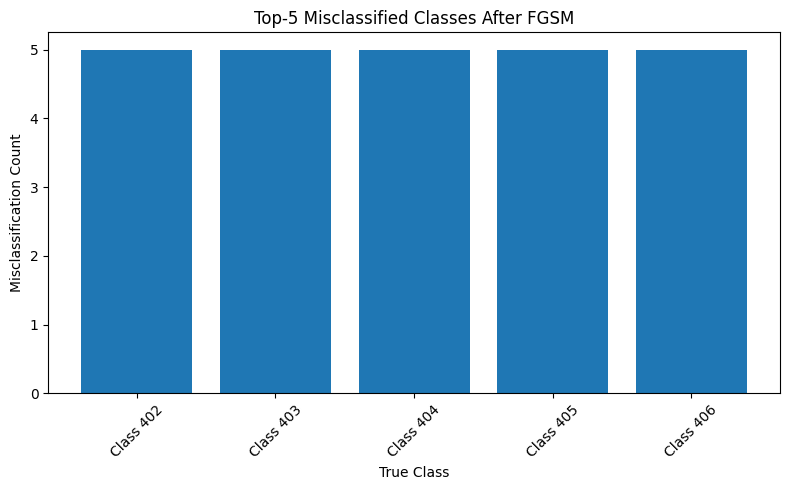

In [49]:
from collections import Counter

def plot_top5_misclassified(true_labels, adv_preds, label_map, title):
    # Only count misclassified
    misclassified = [true for true, adv in zip(true_labels, adv_preds) if true != adv]
    counter = Counter(misclassified)
    top5 = counter.most_common(5)

    labels = [label_map[str(k)][1] if str(k) in label_map else f"Class {k}" for k, _ in top5]
    counts = [v for _, v in top5]

    plt.figure(figsize=(8,5))
    plt.bar(labels, counts)
    plt.title(title)
    plt.xlabel("True Class")
    plt.ylabel("Misclassification Count")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Example: For FGSM
plot_top5_misclassified(
    [label.item() for label in all_true_labels],
    [pred.item() for pred in all_adversarial_preds],
    label_map,
    "Top-5 Misclassified Classes After FGSM"
)


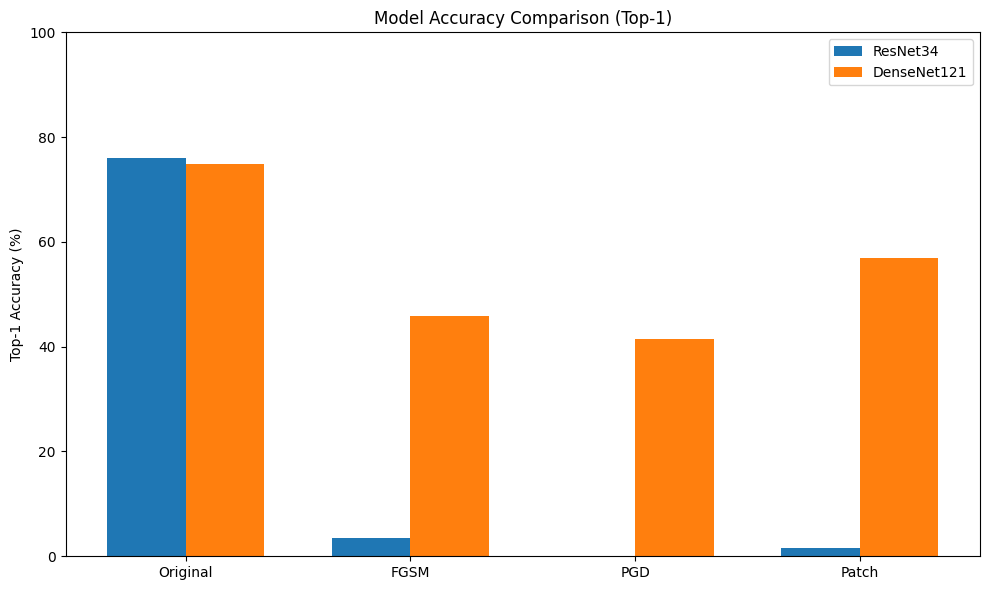

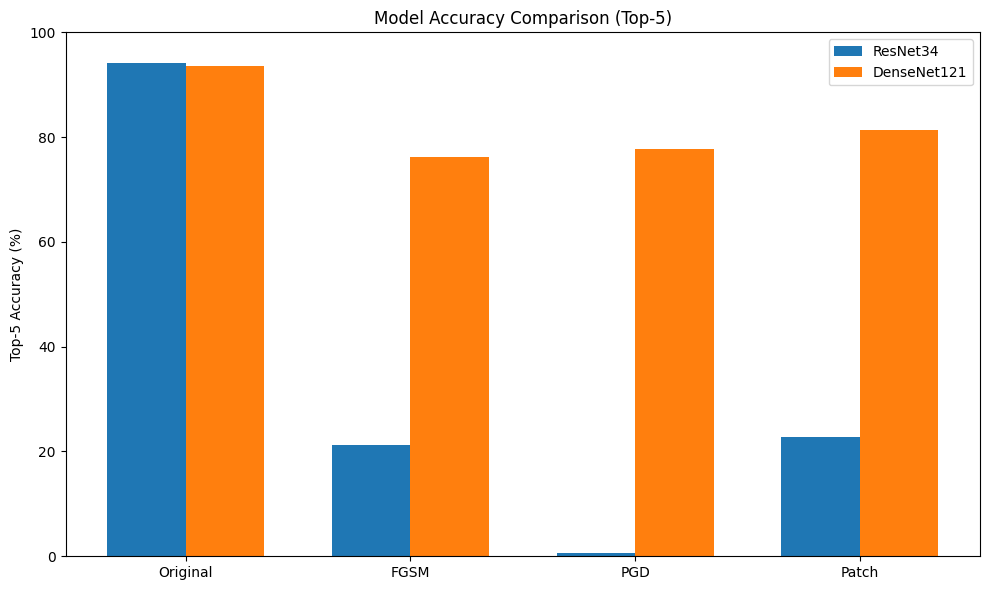

In [50]:
def plot_model_accuracies(all_results, top_k=1):
    datasets = list(all_results.keys())
    resnet_acc = [all_results[d]["ResNet34"][top_k] for d in datasets]
    densenet_acc = [all_results[d]["DenseNet121"][top_k] for d in datasets]

    x = np.arange(len(datasets))
    width = 0.35

    plt.figure(figsize=(10,6))
    plt.bar(x - width/2, resnet_acc, width, label='ResNet34')
    plt.bar(x + width/2, densenet_acc, width, label='DenseNet121')

    plt.ylabel(f"Top-{top_k} Accuracy (%)")
    plt.title(f"Model Accuracy Comparison (Top-{top_k})")
    plt.xticks(x, datasets)
    plt.ylim(0, 100)
    plt.legend()
    plt.tight_layout()
    plt.show()

# Plot Top-1 Accuracy Comparison
plot_model_accuracies(all_results, top_k=1)

# Optionally, also plot Top-5
plot_model_accuracies(all_results, top_k=5)


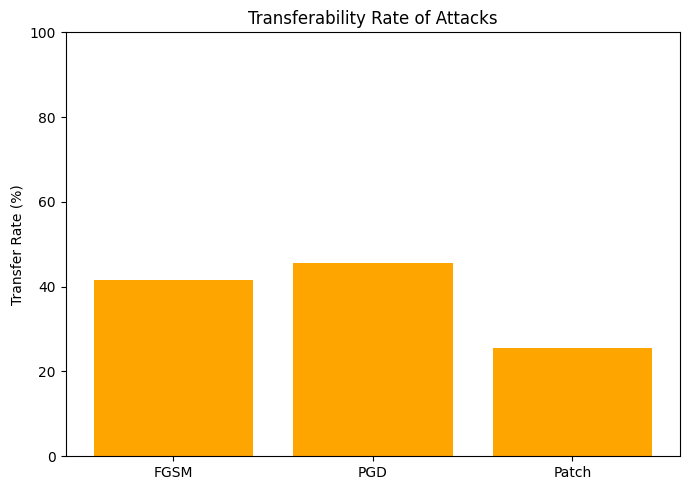

In [51]:
transfer_rates = {
    'FGSM': fgsm_transfer_rate,
    'PGD': pgd_transfer_rate,
    'Patch': patch_transfer_rate
}

plt.figure(figsize=(7,5))
plt.bar(transfer_rates.keys(), transfer_rates.values(), color='orange')
plt.title("Transferability Rate of Attacks")
plt.ylabel("Transfer Rate (%)")
plt.ylim(0, 100)
plt.tight_layout()
plt.show()
